In [ ]:
%%capture
# from google.colab import drive
# drive.mount('/content/drive')
import zipfile
import requests
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import os
import shutil
%pip install ultralytics
import ultralytics
from ultralytics import YOLO
import gdown
!pip install easyocr
import easyocr
from pprint import pprint

In [ ]:
# загрузка тестового изображения
image_test_link = 'https://drive.google.com/file/d/1eG4U3XJQlLitayI3Ph60WWcU75RTdMu7/view?usp=sharing'
image_test_file = '/content/test.png'
gdown.download(image_test_link, image_test_file, fuzzy=True, quiet=True)

'/content/test.png'

In [ ]:
# ФУНКЦИИ
FIELDS = ["01 Receipt Number","04-01 Counterparty 1", "04-02 Counterparty 2",
        "05 Contract","06 Our Company BIN","07 Counterparty Bank BIC", "08 Counterparty Current Account IIC",
        "09 Counterparty Payment Purpose Code", "10 Items Table",
        "10-01 Item", "10-02 Unit","10-03 Quantity", "10-04 Price", "10-05 Amount" ]

def adjust_field_width(item_class, bbox_coordinates): # номера классов, xyxy координаты bb
    # поиск xmin и xmax
    x_mins = []
    x_maxs = []
    item_class  = list(map(int,item_class))
    # print('До',bbox_coordinates)
    for i in range(len(item_class)): # делаем так, потому что может быть несколько полей одного класса
        if FIELDS[item_class[i]] in ["09 Counterparty Payment Purpose Code", "10 Items Table"]:
            print('max',FIELDS[i], bbox_coordinates[i][2])
            x_maxs.append(bbox_coordinates[i][2])
        if FIELDS[item_class[i]] in ["04-01 Counterparty 1", "10 Items Table"]:
            print('min',FIELDS[i], bbox_coordinates[i][0])
            x_mins.append(bbox_coordinates[i][0])
    x_min = np.min(x_mins)
    x_max = np.max(x_maxs)

    for i in range(len(item_class)):
        if FIELDS[item_class[i]] in ["01 Receipt Number","04-02 Counterparty 2", "05 Contract","06 Our Company BIN"]:
            print(FIELDS[i], bbox_coordinates[i][0], bbox_coordinates[i][2])
            bbox_coordinates[i][0] = x_min
            bbox_coordinates[i][2] = x_max
            print(FIELDS[i], bbox_coordinates[i][0], bbox_coordinates[i][2])
    # print('После',bbox_coordinates)
    return bbox_coordinates # возращает новые скорректированные bbox для полей "01 Receipt Number","04-02 Counterparty 2", "05 Contract","06 Our Company BIN"


# обнаружение полей и формирование массива изображений полей
def make_item_images(img_path):
    item_images = {}

    item_images = { field: [] for field in FIELDS }

    # распознаем поля
    img_color = cv2.imread(img_path)
    img = cv2.cvtColor(img_color,cv2.COLOR_BGR2GRAY)

    results = detector(img_path, conf = 0.5)   # распознаем все поля на снимке
    boxes = results[0].boxes                      # выделяем результат: bbox, класс
    item_class = boxes.cls.tolist()                             # выделяем  класс в список
    bbox_coordinates = boxes.xyxy.tolist()                # выделяем  bbox в список
    #bbox_coordinates = adjust_field_width(item_class, bbox_coordinates)  # корректируем ширину bbox для "01 Receipt Number","04-02 Counterparty 2", "05 Contract","06 Our Company BIN"
    for i,bbox in enumerate(bbox_coordinates):
        xmin, ymin, xmax, ymax = bbox
        # if FIELDS[int(item_class[i])] in ["01 Receipt Number","04-02 Counterparty 2", "05 Contract","06 Our Company BIN"]:
        #     print(FIELDS[int(item_class[i])], xmin,xmax)
        red = random.randint(0, 255)
        green = random.randint(0, 255)
        blue = random.randint(0, 255)
        cv2.rectangle(img_color, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (red, green, blue), 4)
        image_cropped = img[int(ymin):int(ymax), int(xmin):int(xmax)]
        # plt.imshow(image_cropped, cmap = 'gray')
        # plt.show()
        for j in FIELDS:
            if FIELDS[int(item_class[i])] == j:
                item_images[j].append(image_cropped)
                plt.imshow(image_cropped, cmap = 'gray')
                plt.title(j)
                plt.show()
    plt.figure(figsize=(20,10))
    plt.imshow(img_color)
    plt.show()

    return item_images

# устранение задвоенных полей, кроме полей "06 Our Company BIN","07 Counterparty Bank BIC"
def clear(item_images):
    for field_name, field_images in item_images.items():
        if field_name not in ["07 Counterparty Bank BIC", "08 Counterparty Current Account IIC"]:
            field_max_area_number = np.argmax(image.shape[0]*image.shape[1] for image in field_images)
            item_images[field_name] = [field_images[field_max_area_number]]
    return item_images

# распознавание текста
def recog_text(field, image):
    reader = easyocr.Reader(['ru','en'])
    result = reader.readtext(image, detail = 1)
    words = ''
    if field in ["10-01 Item", "10-02 Unit","10-03 Quantity", "10-04 Price", "10-05 Amount" ]:
        for prediction in result:
            words += prediction[1] + '\n'
    else:
        for prediction in result:
            words += prediction[1] + ' '
    return words, result

# форматирование для вывода на экран
def format_text(text):
    index = text.find('\n')
    if index != -1:
        return text
    else:
        new_text = []
        string = ''
        words = text.split(' ')
        for word in words:
            if len(string) > 70:
                string += '\n'
                new_text.append(string)
                string = ''
            string += word + ' '
        new_text.append(string)
        return ''.join(new_text)

# формирование текстового массива
def make_item_texts(item_images):
    item_texts = {}
    for field_name, field_images in item_images.items():
        texts = []
        for field_image in field_images:
            words, result = recog_text(field_name, field_image)
            texts.append((words, result))
        item_texts[field_name] = texts

    return item_texts # словарь. {Поле: (текст,  (коорд бб, текст, conf) )}

def plot_bb(box):
        box = np.array(box)
        x = np.append(box[:, 0], box[0, 0])
        y = np.append(box[:, 1], box[0, 1])
        plt.plot(x, y, lw=3.)
# вывод результатов
def show_results(img, text_result):

    boxes = []
    text = text_result[0]
    result = text_result[1]
    for prediction in result:
        boxes.append(prediction[0])
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap = 'gray')
    for box in boxes:
        plot_bb(box)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    if not text:
        text = ''
    plt.text(0, 0.3, format_text(text), fontsize=20)
    plt.axis("off")
    plt.show()

# Датасет с полями по краям листа

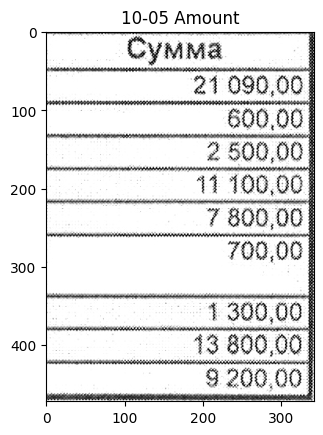

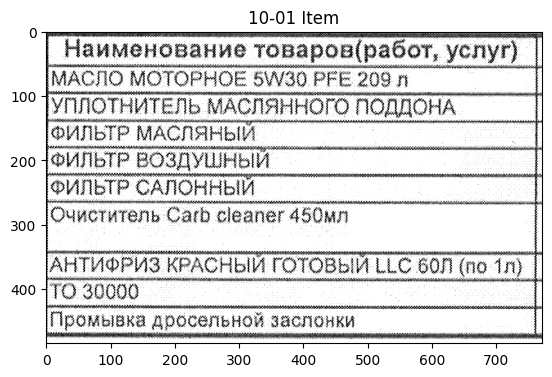

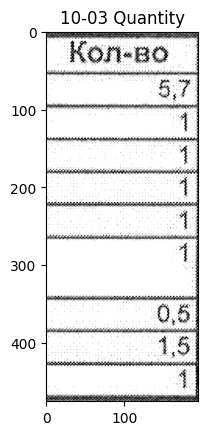

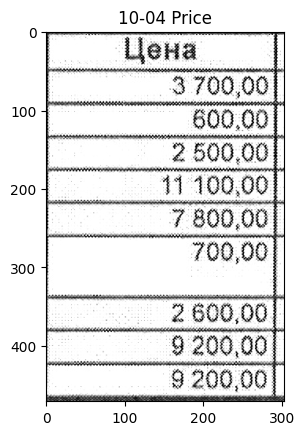

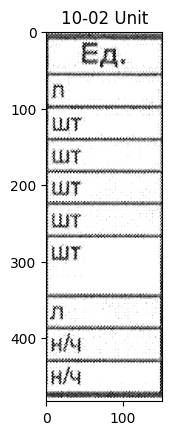

...

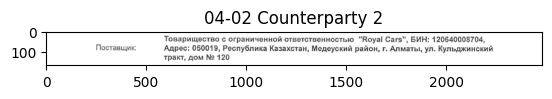

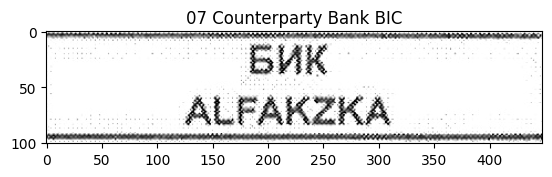

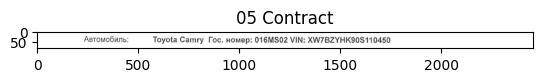

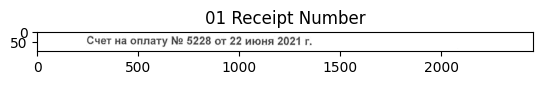

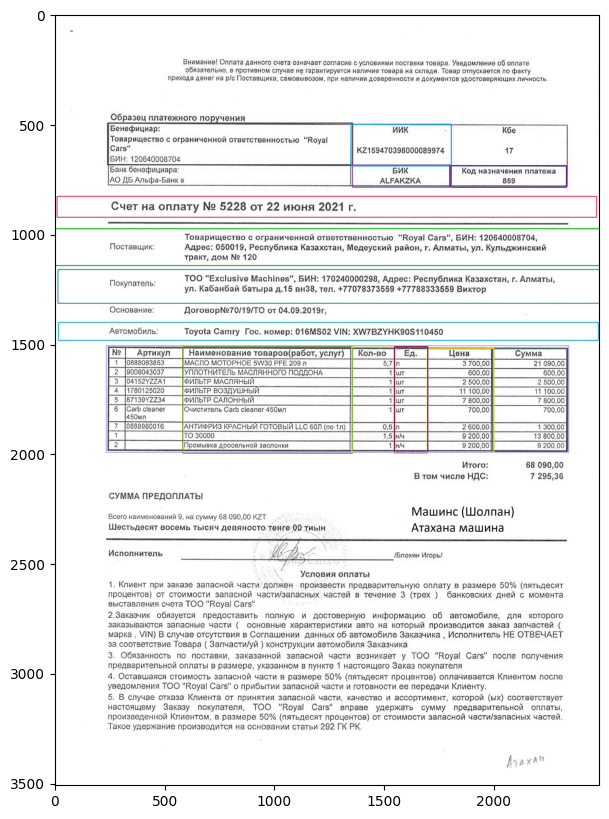

In [ ]:
# удлиненные поля
model_sheet_edges_link = 'https://drive.google.com/file/d/1-ZOn3SVmIJefaXnD1Lxwr9uQGmiu1qkq/view?usp=sharing'
model_file = '/content/detector.pt'
gdown.download(model_sheet_edges_link, model_file, fuzzy=True,  quiet=True)
detector = YOLO(model_file)
item_images = make_item_images(image_test_file)

# Датасет с полями по краям якорных полей

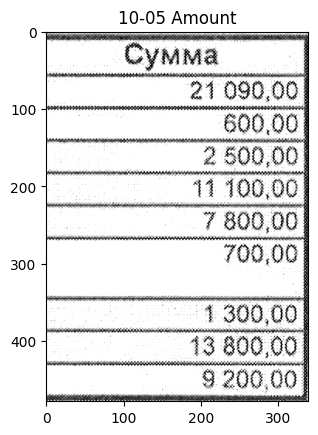

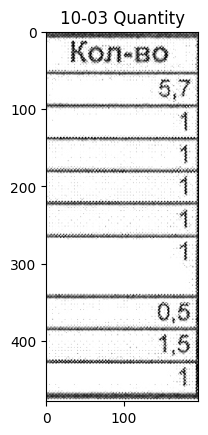

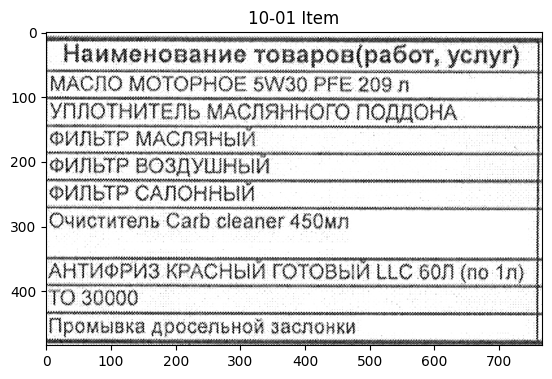

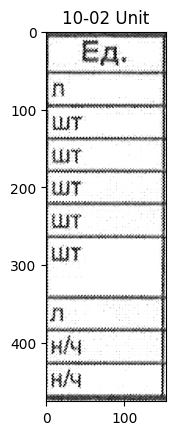

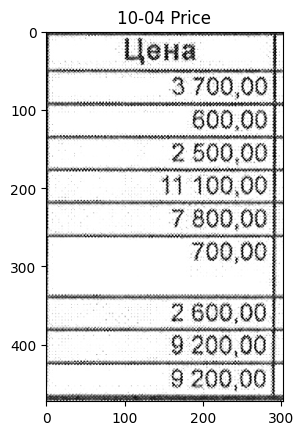

...

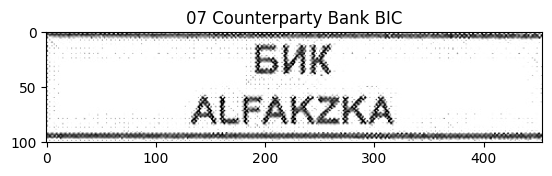

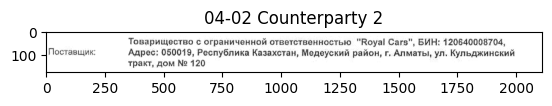

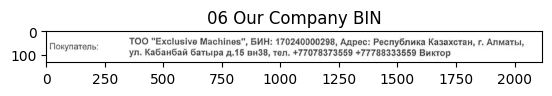

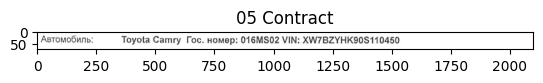

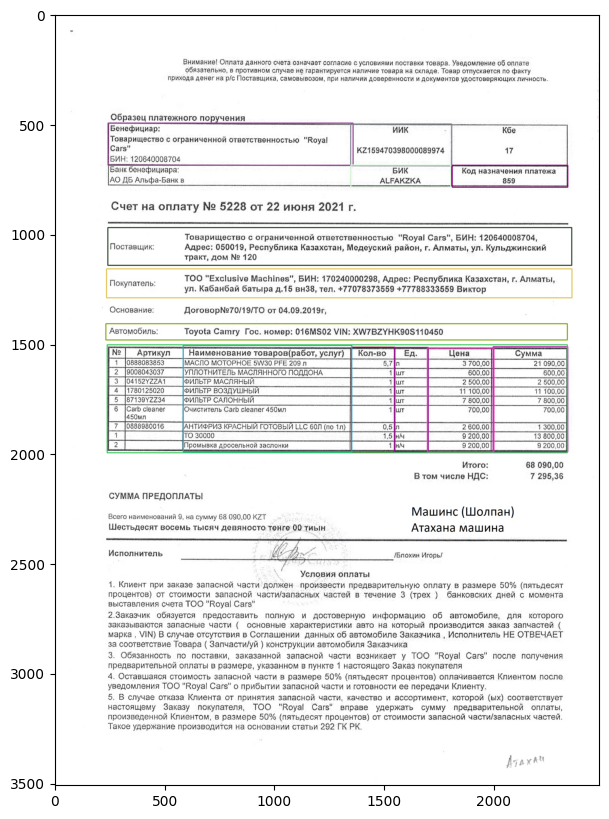

In [ ]:
model_fields_edges_link = 'https://drive.google.com/file/d/1-LJZCAwwr9SHpLcpylDXNXOypSbqxwkD/view?usp=drive_link'
model_file = '/content/detector.pt'
gdown.download(model_fields_edges_link, model_file, fuzzy=True,  quiet=True)
detector = YOLO(model_file)
item_images = make_item_images(image_test_file)

In [ ]:
# очищение от задвоенности (кроме полей "06 Our Company BIN", "07 Counterparty Bank BIC")
item_images = clear(item_images)

In [ ]:
item_texts = make_item_texts(item_images)

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.1% Complete

In [ ]:
for field in item_images:
    # try:
        for img, text in zip(item_images[field], item_texts[field]):
            print('*'*200)
            show_results(img, text)
    # except:
    #     pass

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
pprint(item_texts)

{'01 Receipt Number': [('Счет на оплату Ng 5228 от 22 июня 2021 ',
                        [([[5, 5], [1081, 5], [1081, 73], [5, 73]],
                          'Счет на оплату Ng 5228 от 22 июня 2021',
                          0.8394869888255999)])],
 '04-01 Counterparty 1': [('Бенефициар; Товарищество c ограничонной '
                           'отвотственностью "Royal Cars\' БИН; 120840008704 ',
                           [([[7, 5], [250, 5], [250, 57], [7, 57]],
                             'Бенефициар;',
                             0.76599360169989),
                            ([[10, 53], [1012, 53], [1012, 109], [10, 109]],
                             'Товарищество c ограничонной отвотственностью '
                             '"Royal',
                             0.667614706375396),
                            ([[8, 96], [99, 96], [99, 145], [8, 145]],
                             "Cars'",
                             0.9999915766974431),
                            ([[7, 1

In [ ]:
!pip install Inline-input

In [ ]:
import inline
input = inline.input
name = input('Привет,', inp ='Паша')

# Подготовка датасета для обучения easyocr

In [1]:
%%capture
# from google.colab import drive
# drive.mount('/content/drive')
import zipfile
import requests
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import os
import shutil
import glob
import pandas as pd
from sklearn.model_selection import train_test_split
!pip install utils
# %pip install ultralytics
# import ultralytics
# from ultralytics import YOLO
import gdown
!pip install easyocr
import easyocr
from pprint import pprint

In [3]:
# загрузка тестового изображения
image_test_link = 'https://drive.google.com/file/d/1eG4U3XJQlLitayI3Ph60WWcU75RTdMu7/view?usp=sharing'
image_test_file = '/content/test.png'
gdown.download(image_test_link, image_test_file, fuzzy=True, quiet=True)


text_images_dir = '/content/text_images/'
sep = ',' # чем разделяем название файла и текст в файле .csv

os.makedirs(text_images_dir, exist_ok=True)
csv_path = os.path.join(text_images_dir, 'texts.txt')
img_color = cv2.imread(image_test_file)
image= cv2.cvtColor(img_color,cv2.COLOR_BGR2GRAY)
reader = easyocr.Reader(['ru','en'])
i = 0
data = []
results = reader.readtext(image, detail = 1)


    # image_cropped_name = f'{str(i)}.png'
    # image_cropped_path = os.path.join(text_images_dir, image_cropped_name)
    # cv2.imwrite(image_cropped_path, image_cropped)
    # csv_path = os.path.join(text_images_dir, 'texts.txt')
    # data.append((image_cropped_name, prediction[1]))
    # with open(csv_path, 'a', encoding='utf-8') as f:
    #     f.write(f'{image_cropped_name}{sep}{prediction[1]}\n')
    # i +=1
    # plt.imshow(image_cropped, cmap = 'gray')
    # plt.title(prediction[1])
    # plt.show()

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.1% Complete

In [6]:
def crop_long_strings(img, string):
    if len(string) > 7:
        text_list = string.split()
        len_list_temp = [0]
        len_list_temp.extend([(len(s)+1)/len(string) for s in text_list])
        len_list = []
        summa = 0
        for el in len_list_temp:
          summa += el
          len_list.append(summa)

        print(len_list)
        width = img.shape[1]
        print(width)
        image_list = [img[:,int(len_list[i]*width):int(len_list[i+1]*width)] for i in range(len(len_list)-1)]
    else:
        image_list = [img]
        text_list = [string]

    return image_list, text_list

# def crop_long_strings(image, string):
#     if len(string) > 7:
#         results = reader.readtext(image, detail = 1)
#         image_list =[]
#         text_list = []
#         for prediction in results:
#             print(prediction[1])
#             points = prediction[0]
#             xmin = min([point[0] for point in points])
#             xmax = max([point[0] for point in points])
#             ymin = min([point[1] for point in points])
#             ymax = max([point[1] for point in points])
#             image_cropped = image[int(ymin):int(ymax), int(xmin):int(xmax)]
#             image_list.append(image_cropped)
#             text_list.append(prediction[1])
#     else:
#         image_list = [image]
#         text_list = [string]
#     return image_list, text_list

for prediction in results:
    print(prediction[1])
    # if len(prediction[1].split()) < 3:
    points = prediction[0]
    xmin = min([point[0] for point in points])
    xmax = max([point[0] for point in points])
    ymin = min([point[1] for point in points])
    ymax = max([point[1] for point in points])
    image_cropped = image[int(ymin):int(ymax), int(xmin):int(xmax)]
    plt.imshow(image_cropped, cmap = 'gray')
    plt.title(prediction[1])
    plt.show()
    image_list, text_list = crop_long_strings(image_cropped, prediction[1])
    for img, text in zip(image_list, text_list):
        plt.imshow(img, cmap = 'gray')
        plt.title(text)
        plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# загрузка тестового изображения
image_test_link = 'https://drive.google.com/file/d/1eG4U3XJQlLitayI3Ph60WWcU75RTdMu7/view?usp=sharing'
image_test_file = '/content/test.png'
gdown.download(image_test_link, image_test_file, fuzzy=True, quiet=True)


text_images_dir = '/content/text_images/'
sep = ',' # чем разделяем название файла и текст в файле .csv

os.makedirs(text_images_dir, exist_ok=True)
csv_path = os.path.join(text_images_dir, 'texts.txt')
img_color = cv2.imread(image_test_file)
image= cv2.cvtColor(img_color,cv2.COLOR_BGR2GRAY)
reader = easyocr.Reader(['ru','en'])
i = 0
data = []
results = reader.readtext(image, detail = 1)

for prediction in results:
    points = prediction[0]
    xmin = min([point[0] for point in points])
    xmax = max([point[0] for point in points])
    ymin = min([point[1] for point in points])
    ymax = max([point[1] for point in points])
    image_cropped = image[int(ymin):int(ymax), int(xmin):int(xmax)]
    image_cropped_name = f'{str(i)}.png'
    image_cropped_path = os.path.join(text_images_dir, image_cropped_name)
    cv2.imwrite(image_cropped_path, image_cropped)
    csv_path = os.path.join(text_images_dir, 'texts.txt')
    data.append((image_cropped_name, prediction[1]))
    # with open(csv_path, 'a', encoding='utf-8') as f:
    #     f.write(f'{image_cropped_name}{sep}{prediction[1]}\n')
    i +=1
    # plt.imshow(image_cropped, cmap = 'gray')
    # plt.title(prediction[1])
    # plt.show()

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.1% Complete

In [ ]:
def plot_bb(box, img):
    box = np.array(box)
    x = np.append(box[:, 0], box[0, 0])
    y = np.append(box[:, 1], box[0, 1])
    plt.plot(x, y, lw=3.)

def show_results(img_name, result):
    plt.figure(figsize=(100, 50))
    boxes = []
    words = ''
    for prediction in result:
        boxes.append(prediction[0])
        words = words + prediction[1] + '\n'

    img = cv2.imread(img_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # print(pytesseract.image_to_osd(img))
    # rotated_angle = pytesseract.image_to_osd(img).split('\n')[1].split(' ')[-1]
    # words += 'Угол поворота: '+rotated_angle
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    for box in boxes:
        plot_bb(box, img)
        # попытка детектировать угол поворота текста до горизонтального положения
        # с помощью tesseract. Неудачно
        # box = np.array(box)
        # img_cropped = img[int(box[1, 1]):int(box[2, 1]), int(box[0, 0]):int(box[1, 0])]
        # img_cropped_rot = img_rotate_cropped(img_cropped)
        # plt.imshow(img_cropped_rot)
        # plt.show()
        # plt.imshow(rotated)
        # plt.title(str(angle))
        # plt.show()
        # print(rotated_angle)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.text(0, 0.3, words, fontsize=40)
    plt.axis("off")
    plt.show()


show_results(image_test_file, results)

In [ ]:
from openpyxl import Workbook
from openpyxl.drawing.image import Image

# Создание нового файла Excel
workbook = Workbook()
sheet = workbook.active

for i in range(len(data)):
    img = Image(os.path.join(text_images_dir,data[i][0]))
    # img.width = 500
    img.height = 60

    sheet[f'A{i*5+4}'] = data[i][0]
    sheet.add_image(img, f'B{i*5+1}')
    sheet[f'B{i*5+4}'] = data[i][1]

# Сохранение файла Excel
workbook.save('excel.xlsx')

In [ ]:
ds = pd.read_excel('excel.xlsx')
ds.info()
ds.dropna()

In [ ]:
with open(csv_path, 'r', encoding='utf-8') as f:
    data = f.readlines()
for s in data:
    print(s)

In [ ]:
val_ratio = 0.2
dataset_dir = '/content/dataset/'
train_dir = '/content/dataset/train'
val_dir = '/content/dataset/val'
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Разделение массива на две выборки
train_data, val_data = train_test_split(data, test_size=0.2, random_state=42)

train_data = sorted(train_data, key=lambda x:x[0])
train_df = pd.DataFrame(train_data, columns = ['filename','words'])
train_df.to_csv(os.path.join(train_dir,'labels.csv'), index=False)

val_data = sorted(val_data, key=lambda x:x[0])
val_df = pd.DataFrame(val_data, columns = ['filename','words'])
val_df.to_csv(os.path.join(val_dir,'labels.csv'), index=False)


for  image_name in train_df['filename']:
    image_path_from = os.path.join(text_images_dir, image_name)
    shutil.copy(image_path_from, train_dir)

for  image_name in val_df['filename']:
    image_path_from = os.path.join(text_images_dir, image_name)
    shutil.copy(image_path_from, val_dir)

In [ ]:
shutil.rmtree('/content/dataset/')

In [ ]:
shutil.rmtree('/content/text_images/')

In [ ]:
# проверка полученных выборок, сопоставление списков имен изображений в папке и файле

def check_samples(dir):
    images_name_in_dir = list(map(os.path.basename, sorted(glob.glob(dir + "/*.png"))))
    file_in_dir = glob.glob(dir + "/*.csv")[0] # берем единственный элемент из списка, который возвращает glob
    df = pd.read_csv(file_in_dir)
    images_name_in_file = df['filename'].to_list()
    return images_name_in_dir==images_name_in_file

print('Совпадение списков названий файлов с изображениями в папке и в файле:')
print('Тренировочная выборка: ',check_samples(train_dir))
print('Валидационная выборка: ',check_samples(val_dir))
print('*'*100)

train_len = len(os.listdir(train_dir))-1 # -1 т.к. там же файл labels
val_len = len(os.listdir(val_dir))-1
print('Размер тренировочной выборки: ',train_len)
print('Размер валидационной выборки: ',val_len)
print('Отношение: ', val_len/(train_len+val_len))


Совпадение списков названий файлов с изображениями в папке и в файле:
Тренировочная выборка:  True
Валидационная выборка:  True
****************************************************************************************************
Размер тренировочной выборки:  137
Размер валидационной выборки:  35
Отношение:  0.20348837209302326


# Обучение

In [ ]:
shutil.rmtree('/content/EasyOCR/')

In [ ]:
!git clone https://github.com/JaidedAI/EasyOCR

Cloning into 'EasyOCR'...
remote: Enumerating objects: 2736, done.
remote: Counting objects: 100% (2736/2736), done.
remote: Compressing objects: 100% (1070/1070), done.
remote: Total 2736 (delta 1678), reused 2369 (delta 1633), pack-reused 0
Receiving objects: 100% (2736/2736), 157.83 MiB | 7.24 MiB/s, done.
Resolving deltas: 100% (1678/1678), done.
Updating files: 100% (313/313), done.


In [ ]:
test1_link = 'https://drive.google.com/file/d/1gC80aJMKdN1zJsZRLPiR2I75alINXsxB/view?usp=sharing'
test1_file = '/content/EasyOCR/trainer/test1.py'
gdown.download(test1_link, test1_file, fuzzy=True, quiet=True)

train_link = 'https://drive.google.com/file/d/19jdHvvm2LQoHCXWe1kypsS4WUPYX5sx2/view?usp=sharing'
train_file = '/content/EasyOCR/trainer/train.py'
gdown.download(train_link, train_file, fuzzy=True, quiet=True)

dataset_link = 'https://drive.google.com/file/d/10skGC1rhaRnoL_v7xyP4n2gix4x5apmV/view?usp=sharing'
dataset_file = '/content/EasyOCR/trainer/dataset.py'
gdown.download(dataset_link, dataset_file, fuzzy=True, quiet=True)

cyrillic_link = 'https://drive.google.com/file/d/18LAsLGgyicj8x0dzaO84hQ_M6O3XHG11/view?usp=sharing'
cyrillic_file = '/content/EasyOCR/trainer/cyrillic_g2.pth'
gdown.download(cyrillic_link, cyrillic_file, fuzzy=True, quiet=True)

custom_yaml_link = 'https://drive.google.com/file/d/14DLULWAkr4qXX1YnsoN5vK-nNk9Cwbz5/view?usp=sharing'
custom_yaml_file = '/content/EasyOCR/trainer/custom_EasyOCR/user_network/custom_example.yaml'
gdown.download(custom_yaml_link, custom_yaml_file, fuzzy=True, quiet=True)

custom_py_link = 'https://drive.google.com/file/d/1dP1OepFEaLEI2YJkz0HQZzijIkhNhqVX/view?usp=sharing'
custom_py_file = '/content/EasyOCR/trainer/custom_EasyOCR/user_network/custom_example.py'
gdown.download(custom_py_link, custom_py_file, fuzzy=True, quiet=True)

model_link = 'https://drive.google.com/file/d/18LAsLGgyicj8x0dzaO84hQ_M6O3XHG11/view?usp=sharing'
model_file = '/content/EasyOCR/trainer/custom_EasyOCR/user_network/custom_example.py'
gdown.download(model_link, model_file, fuzzy=True, quiet=True)


shutil.copytree(dataset_dir, '/content/EasyOCR/trainer/all_data/', dirs_exist_ok=True)
os.remove('/content/EasyOCR/trainer/all_data/folder.txt')

In [ ]:
file = '''number: '0123456789'
symbol: "!\"#$%&'()*+,-./:;<=>?@[\\]№_`{|}~ €₽"
lang_char: 'ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyzАБВГДЕЁЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯабвгдеёжзийклмнопрстуфхцчшщъыьэюяЂђЃѓЄєІіЇїЈјЉљЊњЋћЌќЎўЏџҐґҒғҚқҮүҲҳҶҷӀӏӢӣӨөӮӯ'
experiment_name: 'Qazaq_stroy'
train_data: 'all_data/train'
valid_data: 'all_data/val'
manualSeed: 1111
workers: 6
batch_size: 32 #32
num_iter: 1000
valInterval: 200
saved_model: 'cyrillic_g2.pth'
FT: True
optim: False # значение по умолчанию - Adadelta
lr: 1.
beta1: 0.9
rho: 0.95
eps: 0.00000001
grad_clip: 5
#Data processing
select_data: '/' # это папка dataset в train_data
batch_ratio: '1'
total_data_usage_ratio: 1.0
batch_max_length: 68
imgH: 64
imgW: 600
rgb: False
contrast_adjust: False
sensitive: True
PAD: True
contrast_adjust: 0.0
data_filtering_off: False
# Архитектура модели
Transformation: 'None'
FeatureExtraction: 'VGG'
SequenceModeling: 'BiLSTM'
Prediction: 'CTC'
num_fiducial: 20
input_channel: 1
output_channel: 256
hidden_size: 256
decode: 'greedy'
new_prediction: False
freeze_FeatureFxtraction: False
freeze_SequenceModeling: False
'''

with open('/content/EasyOCR/trainer/config_files/custom_data_train.yaml', 'w', encoding='utf-8') as f:
    f.write(file)

In [ ]:
%cd /content/EasyOCR/trainer
import os
import torch.backends.cudnn as cudnn
import yaml
from train import train
from utils import AttrDict
import pandas as pd

cudnn.benchmark = True
cudnn.deterministic = False

def get_config(file_path):
    with open(file_path, 'r', encoding="utf8") as stream:
        opt = yaml.safe_load(stream)
    opt = AttrDict(opt)
    if opt.lang_char == 'None':
        characters = ''
        for data in opt['select_data'].split('-'):
            csv_path = os.path.join(opt['train_data'], data, 'labels.csv')
            df = pd.read_csv(csv_path, sep='^([^,]+),', engine='python', usecols=['filename', 'words'], keep_default_na=False)
            all_char = ''.join(df['words'])
            characters += ''.join(set(all_char))
        characters = sorted(set(characters))
        opt.character= ''.join(characters)
    else:
        opt.symbol = "!\"#$%&'()*+,-./:;<=>?@[\\]№_`{|}~ €₽"
        opt.character = opt.number + opt.symbol + opt.lang_char
        print(opt.symbol)
    os.makedirs(f'./saved_models/{opt.experiment_name}', exist_ok=True)
    return opt

#Запускаем обучение
opt = get_config("config_files/custom_data_train.yaml")
train(opt, amp=False)

/content/EasyOCR/trainer
!"#$%&'()*+,-./:;<=>?@[\]№_`{|}~ €₽
Filtering the images containing characters which are not in opt.character
Filtering the images whose label is longer than opt.batch_max_length
--------------------------------------------------------------------------------
dataset_root: all_data/train
opt.select_data: ['/']
opt.batch_ratio: ['1']
--------------------------------------------------------------------------------
dataset_root:    all_data/train	 dataset: /
all_data/train/
sub-directory:	/.	 num samples: 130
num total samples of /: 130 x 1.0 (total_data_usage_ratio) = 130
num samples of / per batch: 32 x 1.0 (batch_ratio) = 32


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


--------------------------------------------------------------------------------
Total_batch_size: 32 = 32
--------------------------------------------------------------------------------
dataset_root:    all_data/val	 dataset: /
all_data/val/
sub-directory:	/.	 num samples: 34
--------------------------------------------------------------------------------
No Transformation module specified
model input parameters 64 600 20 1 256 256 208 68 None VGG BiLSTM CTC


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


loading pretrained model from cyrillic_g2.pth
Model:
DataParallel(
  (module): Model(
    (FeatureExtraction): VGG_FeatureExtractor(
      (ConvNet): Sequential(
        (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): ReLU(inplace=True)
        (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (7): ReLU(inplace=True)
        (8): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (9): ReLU(inplace=True)
        (10): MaxPool2d(kernel_size=(2, 1), stride=(2, 1), padding=0, dilation=1, ceil_mode=False)
        (11): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (12): BatchNorm

SystemExit: ignored

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3561: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [ ]:
l ='0123456789!"#$%&'()*+,-./:;<=>?@[\]№_`{|}~ €₽ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyzАБВГДЕЁЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯабвгдеёжзийклмнопрстуфхцчшщъыьэюяЂђЃѓЄєІіЇїЈјЉљЊњЋћЌќЎўЏџҐґҒғҚқҮүҲҳҶҷӀӏӢӣӨөӮӯ'
len(l)

In [ ]:
reader_custom = easyocr.Reader(['en'],
                        model_storage_directory='custom_EasyOCR/model',
                        user_network_directory='custom_EasyOCR/user_network',
                        recog_network='custom_example')

In [ ]:
results = reader_custom.readtext(image, detail = 1)

In [ ]:
pprint(results)

[([[577, 190], [2160, 190], [2160, 245], [577, 245]],
  'Вниманиеl Оnnaта данного счета означает cornасие с успсвиями поставки '
  'товара Уведомление 0б оплате',
  0.3718687492539141),
 ([[584, 227], [2170, 227], [2170, 279], [584, 279]],
  'обязатеnьно; ₽ противном случае не гарантируется наличие товара на складе; '
  'Тозар отпускается по факту',
  0.5752388077642155),
 ([[506, 267], [2239, 267], [2239, 312], [506, 312]],
  'прихода денer на plc Поставщика; самовывозом, при наличии доверенности и '
  'докумөнтов удостоверяющих личкость',
  0.4361649481786895),
 ([[241, 433], [874, 433], [874, 505], [241, 505]],
  'Образец платежного поручения',
  0.9072059682731126),
 ([[244, 491], [487, 491], [487, 547], [244, 547]],
  'Бенефициар;',
  0.9999906548034274),
 ([[1529, 501], [1614, 501], [1614, 545], [1529, 545]],
  'ИИК',
  0.9999821053874435),
 ([[2030, 504], [2105, 504], [2105, 548], [2030, 548]],
  'Кбе',
  0.999796485725624),
 ([[245, 539], [1252, 539], [1252, 601], [245, 601]],


# Мусор

In [ ]:
# редактирование текста
with open(csv_path, 'r', encoding='utf-8') as f:
    data = f.readlines()
    data = [d.split(',') for d in data[1:]]

for line in data:
    image_name, image_text = line[0], ''.join(line[1:])
    image_path = os.path.join(text_images_dir, image_name)
    print(image_path)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    plt.figure(figsize=(10,2))
    # plt.subplot(2, 1, 1)
    plt.imshow(image, cmap = 'gray')
    plt.axis("off")
    print(image_text)
    # plt.subplot(2, 1, 2)
    # plt.text(0, 0.3, image_text, fontsize=10)
    # plt.axis("off")
    plt.show()

    a = input()

In [ ]:
reader = easyocr.Reader(['ru','en'])
SCAN_DIR = '/content/drive/MyDrive/Colab Notebooks/OCR/Scans'

for image in SCAN_DIR:
    results = reader.readtext(image, detail = 1)
    for prediction in results:
        points = prediction[0]
        xmin = min([point[0] for point in points])
        xmax = max([point[0] for point in points])
        ymin = min([point[1] for point in points])
        ymax = max([point[1] for point in points])
        image_cropped = img[int(ymin):int(ymax), int(xmin):int(xmax)]
        plt.show(image_cropped)
        plt.show()
